<a href="https://colab.research.google.com/github/ash11sh/opencv-notes/blob/master/learn_opencv_part3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## image histogram equalization

In [0]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

def custom_hist(gray):
  h,w = gray.shape
  hist = np.zeros([256], dtype=np.int32)
  for row in range(h):
    for col in range(w):
      pv = gray[row, col]
      hist[pv] +=1

  y_pos = np.arange(0,256,1, dtype = np.int32)
  plt.bar(y_pos,  hist, align='center', color='r', alpha=0.5)
  plt.xticks(y_pos, y_pos)
  
  plt.ylabel('Frequency')
  plt.title('histogram')
  plt.show()



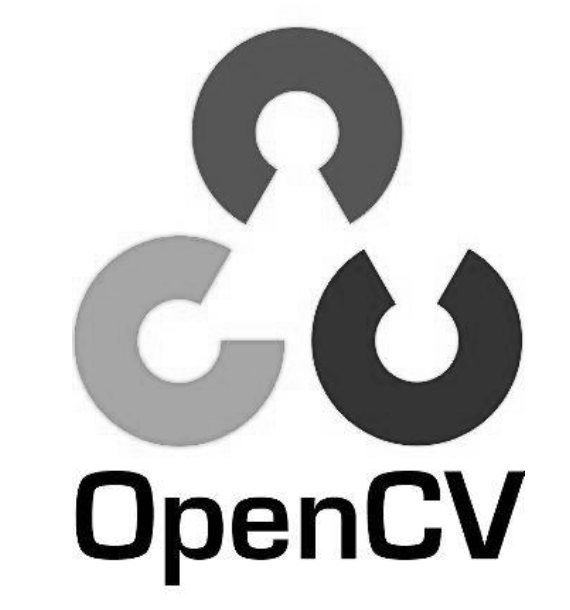

In [ ]:
src = cv2.imread('test.png')
gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)


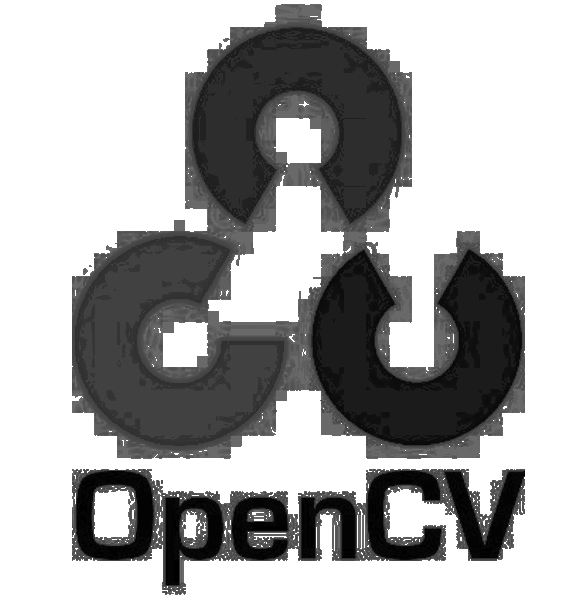

In [ ]:
dst = cv2.equalizeHist(gray)
cv2_imshow(dst)

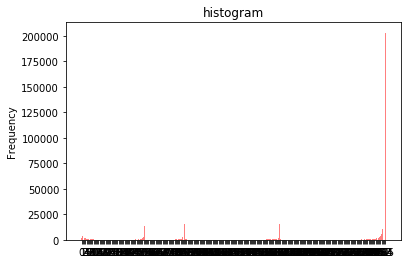

In [ ]:
custom_hist(gray)

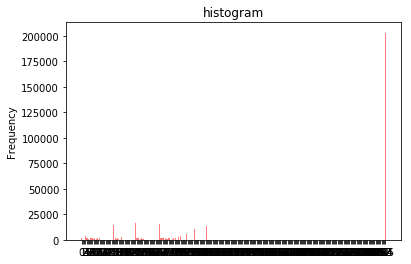

In [ ]:
custom_hist(dst)

## histogram comparision

In [0]:
src1 = cv2.imread('test.png')
src2 = cv2.imread('test01.png')
src3 = cv2.imread('test.png')
src4 = cv2.imread('test.png')


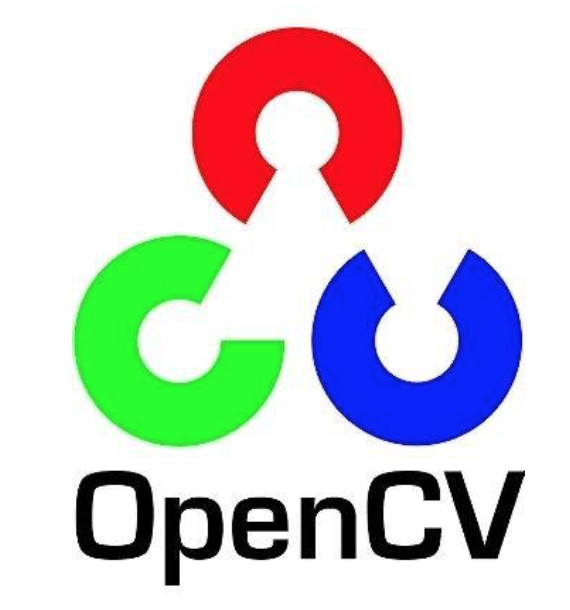

In [ ]:
cv2_imshow(src1)

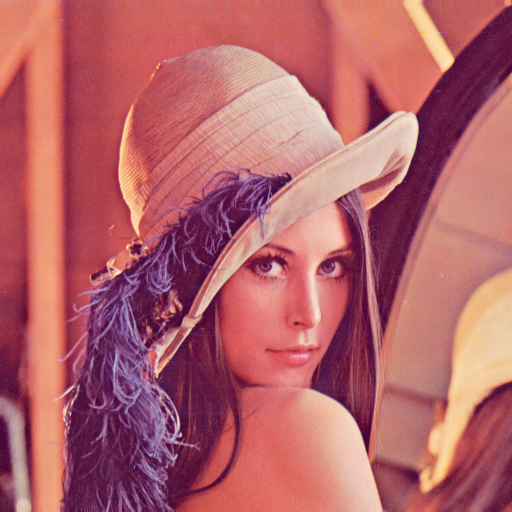

In [ ]:
cv2_imshow(src2)

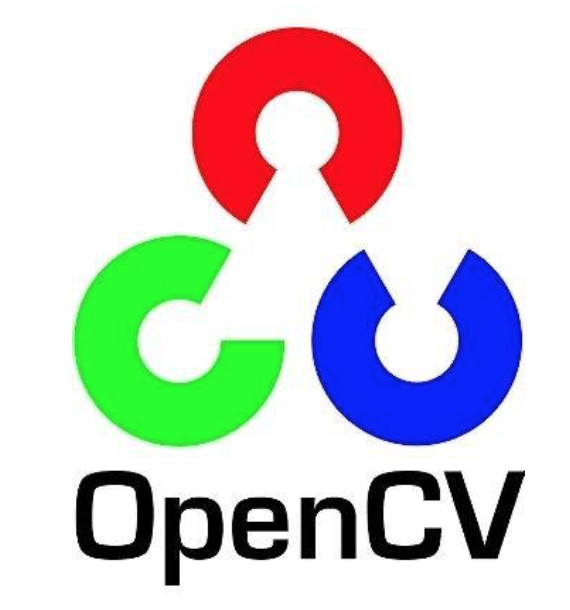

In [ ]:
cv2_imshow(src3)

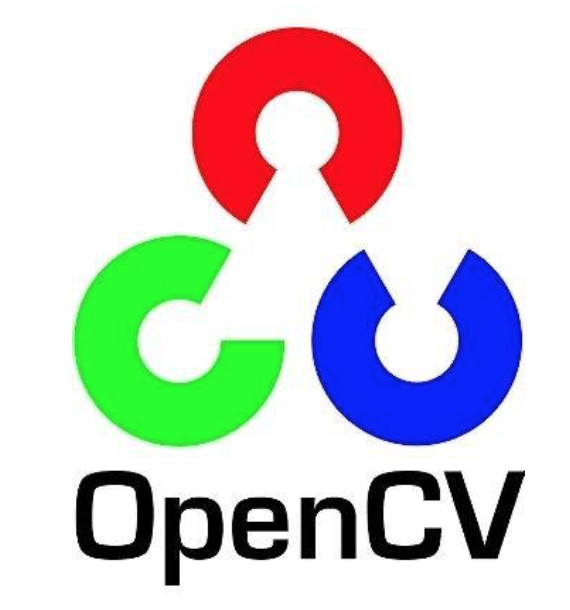

In [ ]:
cv2_imshow(src4)

In [0]:
hsv1 = cv2.cvtColor(src1, cv2.COLOR_BGR2HSV)
hsv2 = cv2.cvtColor(src2, cv2.COLOR_BGR2HSV)
hsv3 = cv2.cvtColor(src3, cv2.COLOR_BGR2HSV)
hsv4 = cv2.cvtColor(src4, cv2.COLOR_BGR2HSV)

In [0]:
hist1 = cv2.calcHist([hsv1],[0,1],None, [60,64],[0,180,0,256])
hist2 = cv2.calcHist([hsv2],[0,1],None, [60,64],[0,180,0,256])
hist3 = cv2.calcHist([hsv3],[0,1],None, [60,64],[0,180,0,256])
hist4 = cv2.calcHist([hsv4],[0,1],None, [60,64],[0,180,0,256])

In [ ]:
cv2.normalize(hist1,hist1, 0,1.0,cv2.NORM_MINMAX)
cv2.normalize(hist2,hist2, 0,1.0,cv2.NORM_MINMAX)
cv2.normalize(hist3,hist3, 0,1.0,cv2.NORM_MINMAX)
cv2.normalize(hist4,hist4, 0,1.0,cv2.NORM_MINMAX)

array([[1.0000000e+00, 7.6817774e-04, 1.9740881e-04, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 3.0040470e-04, 1.8024282e-04, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 9.4412907e-04, 1.4161936e-04, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       ...,
       [0.0000000e+00, 4.2056659e-04, 1.2445338e-04, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 3.6048563e-04, 1.2445338e-04, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 0.0000000e+00, 1.2874487e-04, ..., 4.2914958e-06,
        0.0000000e+00, 0.0000000e+00]], dtype=float32)

In [ ]:
methods = [cv2.HISTCMP_CORREL, cv2.HISTCMP_CHISQR,
           cv2.HISTCMP_INTERSECT, cv2.HISTCMP_BHATTACHARYYA]
str_method = ""
for method in methods:
    src1_src2 = cv2.compareHist(hist1, hist2, method)
    src3_src4 = cv2.compareHist(hist3, hist4, method)
    if method == cv2.HISTCMP_CORREL:
        str_method = "Correlation"
    if method == cv2.HISTCMP_CHISQR:
        str_method = "Chi-square"
    if method == cv2.HISTCMP_INTERSECT:
        str_method = "Intersection"
    if method == cv2.HISTCMP_BHATTACHARYYA:
        str_method = "Bhattacharyya"

    print("%s src1_src2 = %.2f, src3_src4 = %.2f"%(str_method, src1_src2, src3_src4))
    

Correlation src1_src2 = -0.01, src3_src4 = 1.00
Chi-square src1_src2 = 650892.20, src3_src4 = 0.00
Intersection src1_src2 = 0.02, src3_src4 = 1.49
Bhattacharyya src1_src2 = 0.97, src3_src4 = 0.00


## image histogram back projection

sample


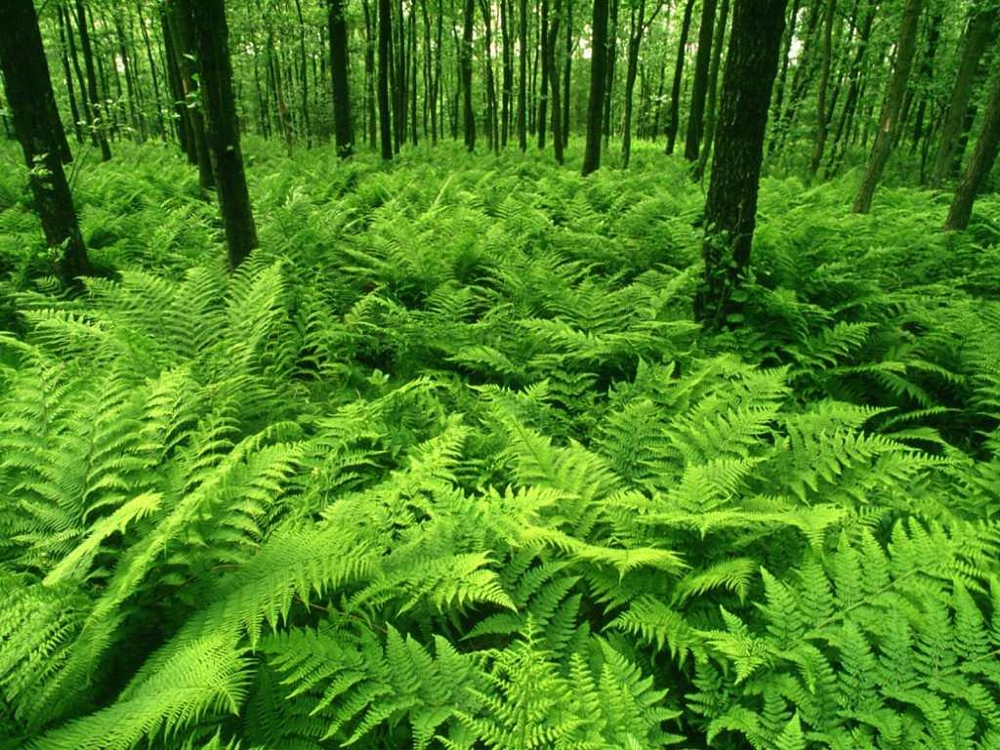

target


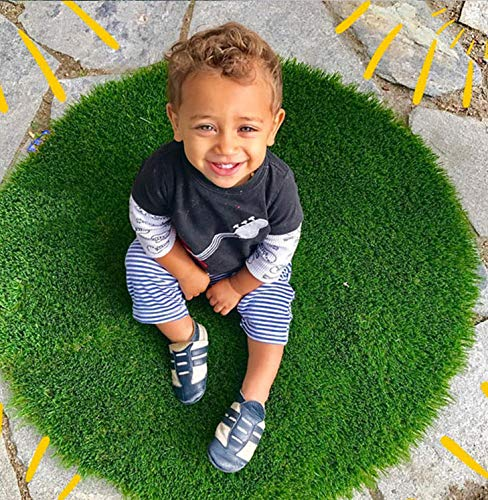

In [ ]:
import cv2 
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


sample =cv2.imread('green_forest.jpg')
  
target = cv2.imread('boy.jpg')


roi_hsv = cv2.cvtColor(sample, cv2.COLOR_BGR2HSV)
target_hsv = cv2.cvtColor(target, cv2.COLOR_BGR2HSV)

#SHOW IMAGES
print('sample')
cv2_imshow(sample)
  
print('target')
cv2_imshow(target)



In [0]:
def hist2d_demo(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hist = cv2.calcHist([hsv], [0, 1], None, [32, 32], [0, 180, 0, 256])
    dst = cv2.resize(hist, (400, 400))
    cv2_imshow(image)
    cv2_imshow(dst)
    plt.imshow(hist, interpolation='nearest')
    plt.title("2D Histogram")
    plt.show()

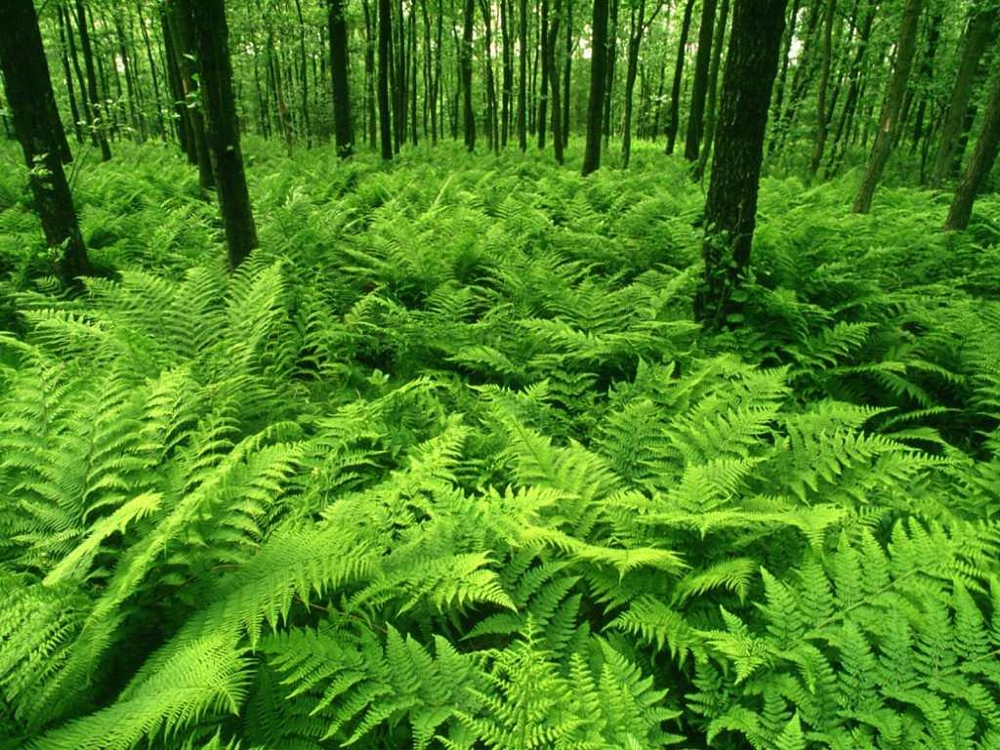

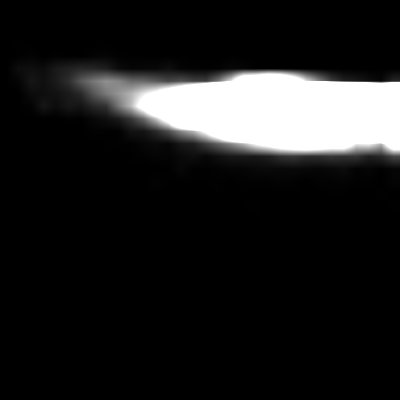

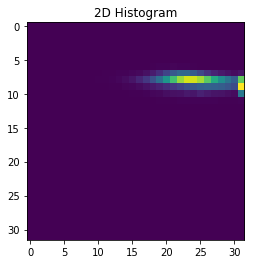

In [ ]:
hist2d_demo(sample)

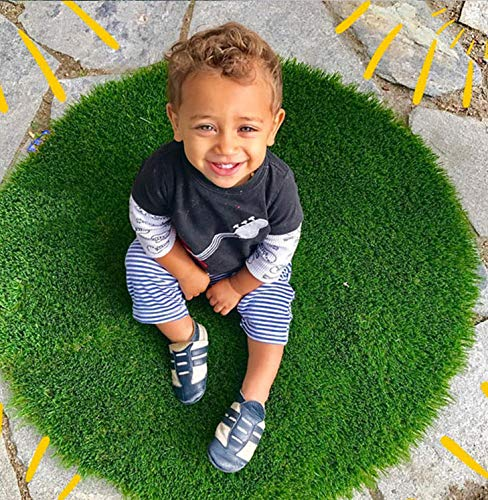

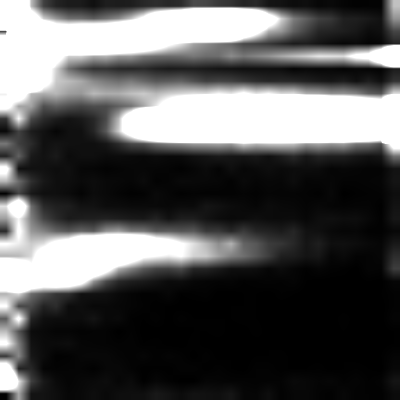

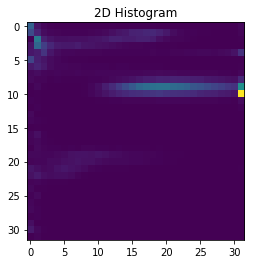

In [ ]:
hist2d_demo(target)

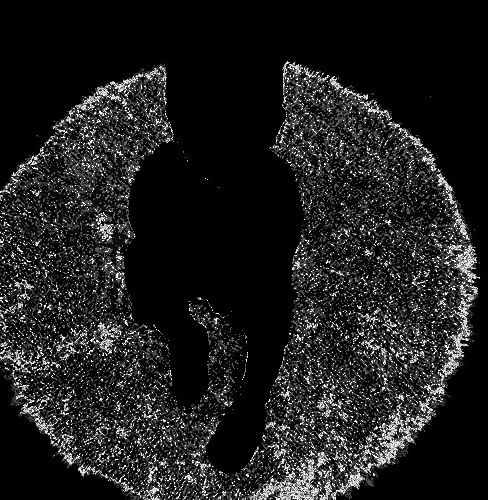

In [ ]:
roiHist = cv2.calcHist([roi_hsv], [0, 1], None, [32, 32], [0, 180, 0, 256])
cv2.normalize(roiHist, roiHist, 0, 255, cv2.NORM_MINMAX)
dst = cv2.calcBackProject([target_hsv], [0, 1], roiHist, [0, 180, 0, 256], 1)
cv2_imshow(dst)

## Image convolution Operation

In [0]:
def custom_blur(src):
  h, w, ch = src.shape
  print("h, w, ch",h,w,ch)
  result = np.copy(src)
  for row in range(1, h-1, 1):
    for col in range(1, w-1, 1):
      v1 = np.int32(src[row-1, col-1])
      v2 = np.int32(src[row-1, col])
      v3 = np.int32(src[row-1, col+1])
      v4 = np.int32(src[row, col-1])
      v5 = np.int32(src[row, col])
      v6 = np.int32(src[row, col+1])
      v7 = np.int32(src[row+1, col-1])
      v8 = np.int32(src[row+1, col])
      v9 = np.int32(src[row+1, col+1])

      b = v1[0] + v2[0] + v3[0] + v4[0] + v5[0] + v6[0] + v7[0] + v8[0] + v9[0];
      g = v1[1] + v2[1] + v3[1] + v4[1] + v5[1] + v6[1] + v7[1] + v8[1] + v9[1];
      r = v1[2] + v2[2] + v3[2] + v4[2] + v5[2] + v6[2] + v7[2] + v8[2] + v9[2];
      result[row, col] = [b//9, g//9, r//9]

  cv2_imshow(result)

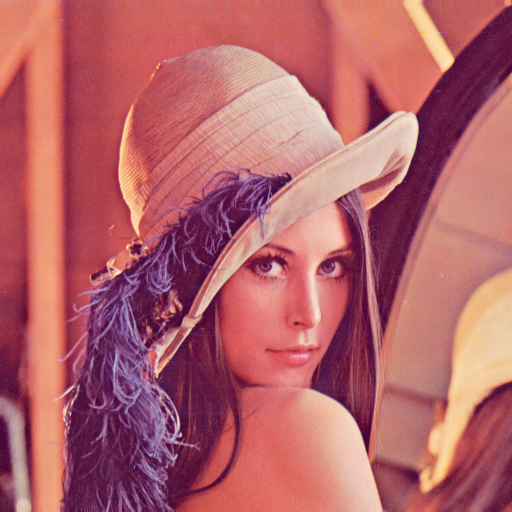

In [ ]:
src = cv2.imread('test01.png')
cv2_imshow(src)

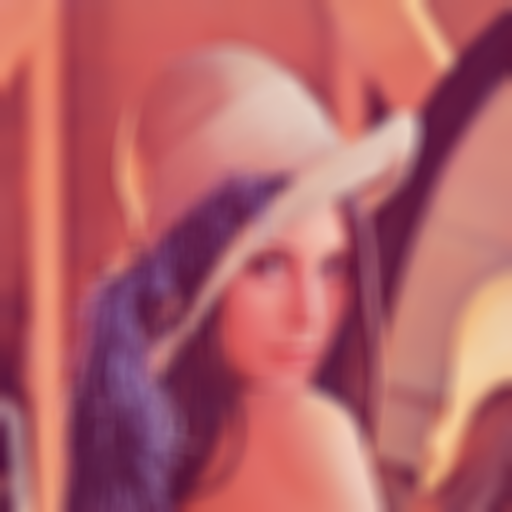

In [ ]:
dst = cv2.blur(src,(20,20))
cv2_imshow(dst)

h, w, ch 512 512 3


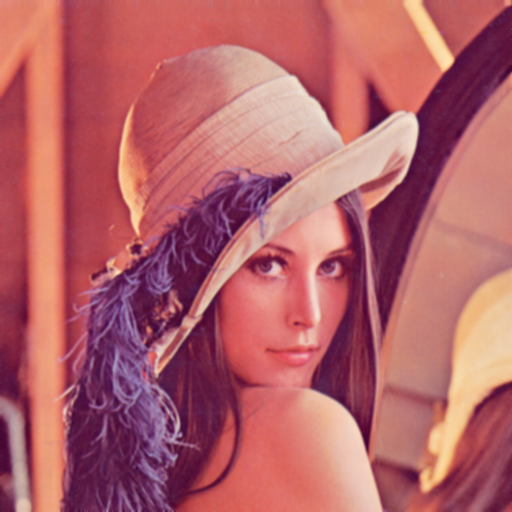

In [ ]:
custom_blur(src)

## image mean and Gaussian blur

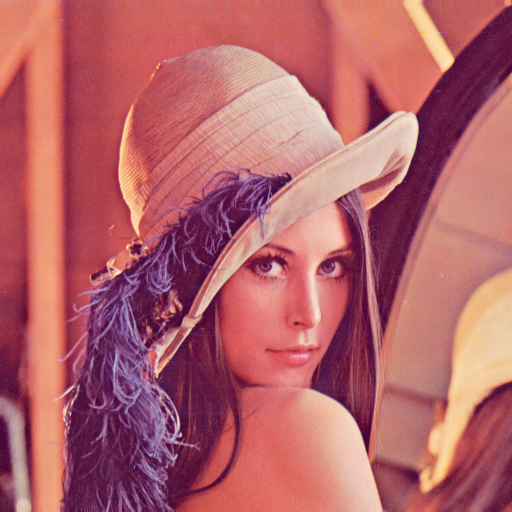

In [ ]:
src = cv2.imread('test01.png')
cv2_imshow(src)

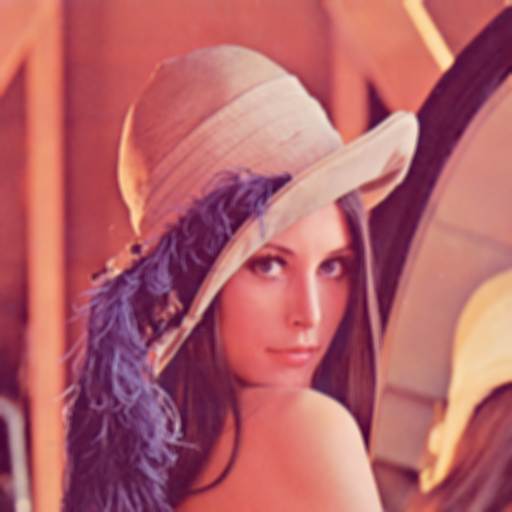

In [ ]:
#blur ksize is 5
dst1 = cv2.blur(src,(5,5))
cv2_imshow(dst1)

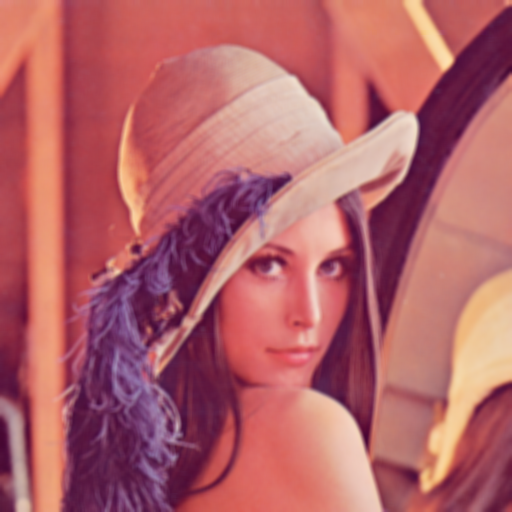

In [ ]:
#gaussian ksize is 5
dst2 = cv2.GaussianBlur(src,(5,5),sigmaX=15)
cv2_imshow(dst2)

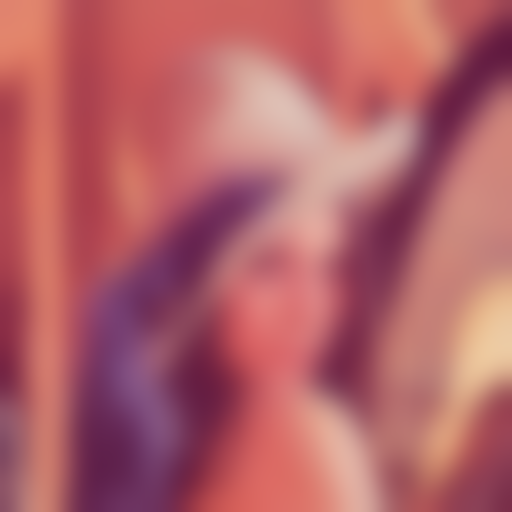

In [ ]:
#gaussian sigmax=15
dst3 = cv2.GaussianBlur(src,(0,0),sigmaX = 15)
cv2_imshow(dst3)

## median value blur

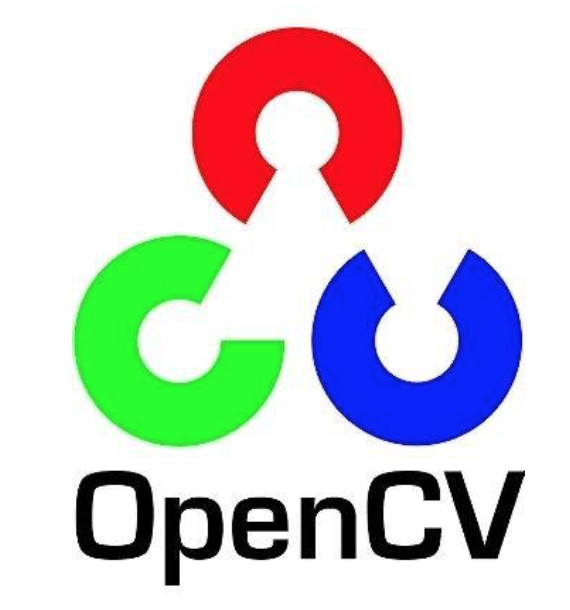

In [ ]:
src = cv2.imread('test.png')
cv2_imshow(src)

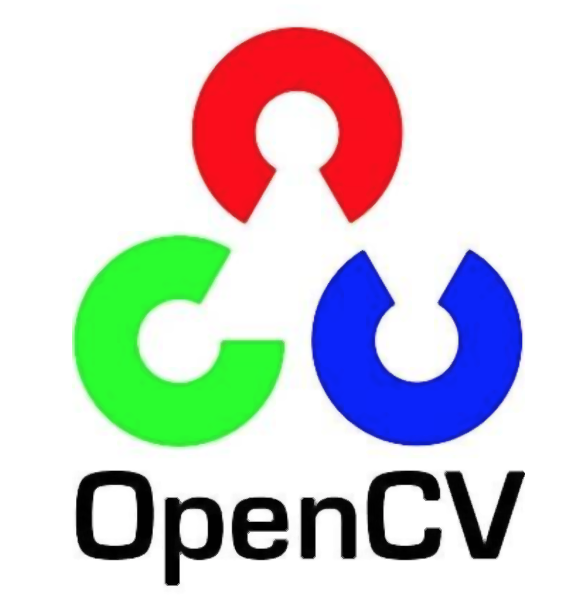

In [ ]:
#kernel size is 5
dst = cv2.medianBlur(src, 5)
cv2_imshow(dst)

## Image noise

In [0]:
def add_salt_pepper_noise(image):
  h,w = image.shape[:2]
  nums = 10000
  rows = np.random.randint(0, h, nums, dtype=np.int)
  cols = np.random.randint(0, w, nums, dtype=np.int)
  for i in range(nums):
    if  i % 2 == 1:
      image[rows[i], cols[i]] = (255, 255, 255)
    else:
      image[rows[i],cols[i]] = (0, 0, 0)
        
  return image 


def guassian_noise(image):
  noise = np.zeros(image.shape, image.dtype)
  m = (15, 15, 15)
  s = (30, 30, 30)
  cv2.randn(noise, m, s)
  dst = cv2.add(image, noise)
  cv2_imshow(dst)
  return dst

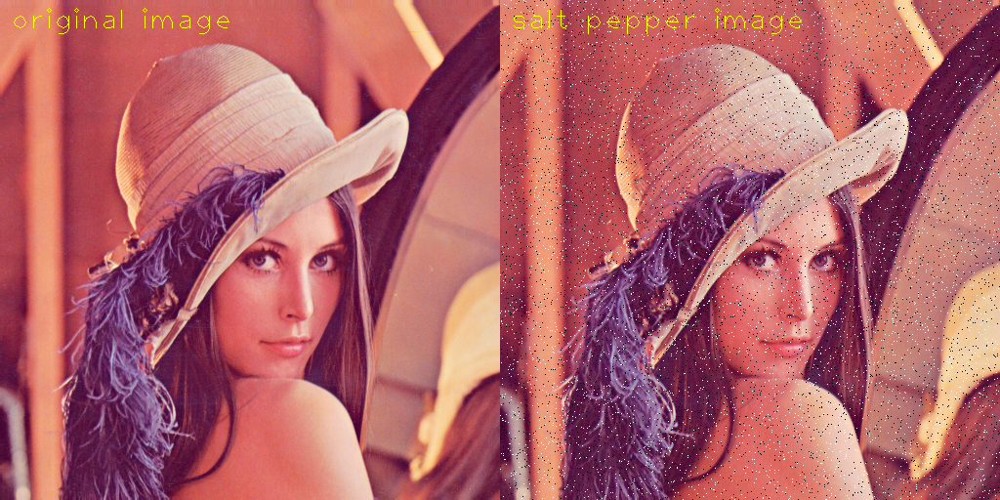

In [ ]:
src = cv2.imread('test01.png')
h, w = src.shape[:2]
copy = np.copy(src)
copy = add_salt_pepper_noise(copy)

result = np.zeros([h, w*2, 3], dtype=src.dtype)
result[0:h,0:w,:] = src
result[0:h,w:2*w,:] = copy 
cv2.putText(result, "original image", (10, 30), cv2.FONT_HERSHEY_PLAIN, 2.0, (0, 255, 255), 1)
cv2.putText(result, "salt pepper image", (w+10, 30), cv2.FONT_HERSHEY_PLAIN, 2.0, (0, 255, 255), 1)
cv2_imshow(result)